## Older Half: Spousal Age Gap

Using the Indian electoral roll data, we estimate gap between the ages of husband and wife, and how the age difference varies across states, and by the age of husband and wife. 

On average, the husbands are XX years older than their wives. The difference is highly variable and systematically varies across states and by age of the husband and wife. The age gap is larger for older husbands.

* [Research design](#research-design)
* [Scripts for finding couples and analysis](#scripts)
* [Underlying data that can be downloaded](#data)

### Research Design

We exploit the fact that for married women, electoral rolls have the husband's name. The basic analysis is as follows: within each household, we find all married couples (where both the spouses are alive). For each married couple, we calculate the difference between their average. Our final dataset has the following fields: `husband_age, wife_age, household_id, state, electoral_roll_year`. We next normalize ages so that all ages are using current year as 2017. Next, we do a density plot of the differences, and present mean, median, and standard deviation. Next, we check whether the difference is statistically significant from 0. Next, we present boxplots by states. And lastly, we plot difference as a function of age of husband and wife. 

In [1]:
# import the necessary libraries 
%matplotlib inline 
import seaborn as sns 
import matplotlib.pyplot as plt

import pandas as pd
from glob import glob
import os
from functools import partial

In [2]:
%%time
# Load data from CSVs
fns = sorted(glob('../../finding-couples/output_lev_0/*_exact_match_lev_0.*'))
adf = pd.concat(map(partial(pd.read_csv, usecols=['wife_age', 'husband_age', 'state']), fns), ignore_index=True)
adf

CPU times: user 1min 13s, sys: 241 ms, total: 1min 14s
Wall time: 1min 15s


,wife_age,husband_age,state
0,39,43,andaman
1,32,47,andaman
2,34,34,andaman
3,43,47,andaman
4,40,48,andaman
...,...,...,...
73542636,49,59,uttarakhand
73542637,23,24,uttarakhand
73542638,38,43,uttarakhand
73542639,31,34,uttarakhand


In [3]:
%%time
# Filter for age range below 18 and above 100
invalid_age = adf[(adf.wife_age < 18)|(adf.wife_age > 100)|(adf.husband_age < 18)|(adf.husband_age > 100)]
invalid_age

CPU times: user 623 ms, sys: 287 ms, total: 911 ms
Wall time: 936 ms


,wife_age,husband_age,state
6242,100,113,andaman
18236,42,103,andaman
25268,73,102,andaman
25502,79,104,andaman
26972,83,102,andaman
...,...,...,...
73539006,34,3,uttarakhand
73539202,34,3,uttarakhand
73540256,35,3,uttarakhand
73540824,34,3,uttarakhand


In [4]:
%%time
# Take out the invalid age range
adf.drop(invalid_age.index, inplace=True)
adf

CPU times: user 3.06 s, sys: 1.09 s, total: 4.15 s
Wall time: 4.16 s


,wife_age,husband_age,state
0,39,43,andaman
1,32,47,andaman
2,34,34,andaman
3,43,47,andaman
4,40,48,andaman
...,...,...,...
73542636,49,59,uttarakhand
73542637,23,24,uttarakhand
73542638,38,43,uttarakhand
73542639,31,34,uttarakhand


In [5]:
adf['gap'] = adf['husband_age'] - adf['wife_age']
adf

,wife_age,husband_age,state,gap
0,39,43,andaman,4
1,32,47,andaman,15
2,34,34,andaman,0
3,43,47,andaman,4
4,40,48,andaman,8
...,...,...,...,...
73542636,49,59,uttarakhand,10
73542637,23,24,uttarakhand,1
73542638,38,43,uttarakhand,5
73542639,31,34,uttarakhand,3


In [6]:
adf.describe().round(1)

,wife_age,husband_age,gap
count,69650106.0,69650106.0,69650106.0
mean,43.9,48.0,4.1
std,13.5,14.0,5.5
min,18.0,18.0,-82.0
25%,33.0,37.0,2.0
50%,43.0,47.0,3.0
75%,53.0,57.0,5.0
max,100.0,100.0,81.0


In [7]:
adf.groupby(['state']).describe().round(1)

wife_age                                             \
                  count  mean   std   min   25%   50%   75%    max   
state                                                                
andaman         36577.0  43.9  10.8  18.0  36.0  42.0  50.0   94.0   
andhra        1146088.0  40.0  12.1  18.0  30.0  38.0  48.0  100.0   
arunachal      130331.0  41.6  11.8  18.0  33.0  40.0  49.0  100.0   
assam          185336.0  40.6  11.4  18.0  32.0  39.0  48.0   99.0   
bihar        10903838.0  44.2  12.9  18.0  34.0  44.0  53.0  100.0   
chandigarh     112677.0  44.5  12.3  19.0  35.0  43.0  52.0   99.0   
dadra           11790.0  39.6  12.6  19.0  30.0  37.0  47.0   99.0   
daman            3803.0  39.7  12.6  18.0  30.0  37.0  47.0   91.0   
goa            161365.0  47.1  11.9  19.0  38.0  46.0  55.0  100.0   
gujarat          2573.0  44.7  12.6  18.0  35.0  43.0  53.0   88.0   
haryana       3581068.0  45.2  13.7  19.0  34.0  44.0  55.0  100.0   
himachal       667017.0  44.5  12.6  18.0  35.0  44.0  53.0  100.0   
jharkhand     3085472.0  41.4  13.7  18.0  31.0  40.0  50.0  100.0   
jk              28464.0  47.9  12.9  19.0  38.0  47.0  56.0   96.0   
karnataka      264920.0  40.6  14.3  19.0  29.0  38.0  51.0  100.0   
kerala        1818418.0  50.0  11.7  19.0  42.0  50.0  58.0  100.0   
maharastra    2769053.0  50.8  12.4  19.0  42.0  49.0  59.0   99.0   
manipur        309928.0  45.3  13.8  19.0  35.0  44.0  55.0   99.0   
meghalaya      101413.0  42.3  11.6  19.0  34.0  41.0  50.0  100.0   
mizoram        125789.0  43.0  12.7  18.0  33.0  42.0  52.0   97.0   
mp            8842330.0  41.6  12.8  18.0  32.0  40.0  50.0  100.0   
nagaland       135358.0  49.2  13.8  19.0  39.0  49.0  59.0  100.0   
odisha         783776.0  44.2  13.0  18.0  35.0  43.0  51.0  100.0   
puducherry     169133.0  45.4  11.5  19.0  37.0  44.0  53.0   98.0   
punjab        3011567.0  45.7  13.3  19.0  35.0  44.0  54.0  100.0   
rajasthan    10509054.0  44.7  14.6  18.0  33.0  45.0  55.0   99.0   
sikkim           6760.0  41.7  10.7  20.0  34.0  42.0  47.0   89.0   
tripura        359197.0  41.9  12.0  18.0  33.0  41.0  50.0  100.0   
up           18982011.0  43.2  13.3  18.0  32.0  42.0  53.0  100.0   
uttarakhand   1405000.0  41.5  12.7  18.0  32.0  40.0  50.0  100.0   

            husband_age        ...                      gap                  \
                  count  mean  ...   75%    max       count mean  std   min   
state                          ...                                            
andaman         36577.0  50.3  ...  58.0  100.0     36577.0  6.4  5.2 -50.0   
andhra        1146088.0  45.7  ...  55.0  100.0   1146088.0  5.7  5.3 -70.0   
arunachal      130331.0  47.2  ...  55.0  100.0    130331.0  5.7  6.3 -72.0   
assam          185336.0  49.0  ...  57.0  100.0    185336.0  8.4  6.9 -62.0   
bihar        10903838.0  48.5  ...  57.0  100.0  10903838.0  4.3  6.1 -79.0   
chandigarh     112677.0  48.5  ...  57.0   99.0    112677.0  4.0  4.4 -59.0   
dadra           11790.0  43.4  ...  51.0   99.0     11790.0  3.9  5.0 -76.0   
daman            3803.0  44.2  ...  52.0   90.0      3803.0  4.5  5.2 -30.0   
goa            161365.0  52.7  ...  61.0  100.0    161365.0  5.7  5.6 -73.0   
gujarat          2573.0  48.6  ...  58.0   96.0      2573.0  3.9  4.9 -44.0   
haryana       3581068.0  49.0  ...  58.0  100.0   3581068.0  3.7  4.0 -78.0   
himachal       667017.0  49.7  ...  59.0  100.0    667017.0  5.2  4.4 -73.0   
jharkhand     3085472.0  45.7  ...  55.0  100.0   3085472.0  4.4  9.1 -82.0   
jk              28464.0  51.2  ...  60.0   99.0     28464.0  3.2  5.6 -62.0   
karnataka      264920.0  46.2  ...  57.0  100.0    264920.0  5.5  8.9 -75.0   
kerala        1818418.0  56.1  ...  65.0  100.0   1818418.0  6.1  4.4 -60.0   
maharastra    2769053.0  56.5  ...  65.0   99.0   2769053.0  5.7  5.9 -76.0   
manipur        309928.0  49.7  ...  60.0  100.0    309928.0  4.4  6.2 -68.0   
meghalaya      101413.0  47.9  ...  56.0   99

In [8]:
# % of couples that have gap > 0
len(adf[adf.gap > 0]) * 100 / len(adf)

90.22462363517437

In [26]:
# FIXME: Population random sample
#sdf = adf.sample(120000, random_state=21)

# FIXME: Stratified random sample per state
group_size = 4000
lst = []
for class_index, group in adf.groupby('state'):
    lst.append(group.sample(group_size, replace=True, random_state=21))
sdf = pd.concat(lst)
sdf

,wife_age,husband_age,state,gap
15306,60,68,andaman,8
5327,54,57,andaman,3
5944,31,41,andaman,10
8965,57,58,andaman,1
16433,49,53,andaman,4
...,...,...,...,...
73022278,77,80,uttarakhand,3
73070513,58,61,uttarakhand,3
72378647,47,51,uttarakhand,4
73175811,52,56,uttarakhand,4


In [27]:
sdf.describe().round(1)

,wife_age,husband_age,gap
count,120000.0,120000.0,120000.0
mean,44.0,48.9,4.9
std,13.0,13.7,6.0
min,18.0,18.0,-73.0
25%,34.0,38.0,2.0
50%,43.0,48.0,4.0
75%,52.0,58.0,7.0
max,98.0,100.0,77.0


In [28]:
sdf.groupby(['state']).describe().round(1)

wife_age                                           husband_age  \
               count  mean   std   min   25%   50%   75%   max       count   
state                                                                        
andaman       4000.0  44.2  11.1  21.0  36.0  43.0  51.0  93.0      4000.0   
andhra        4000.0  40.1  12.0  19.0  30.0  39.0  48.0  88.0      4000.0   
arunachal     4000.0  41.6  12.1  18.0  33.0  40.0  49.0  89.0      4000.0   
assam         4000.0  40.7  11.2  18.0  32.0  39.0  48.0  95.0      4000.0   
bihar         4000.0  44.6  13.2  18.0  35.0  44.0  53.0  98.0      4000.0   
chandigarh    4000.0  44.3  12.5  19.0  35.0  43.0  52.0  94.0      4000.0   
dadra         4000.0  39.5  12.5  19.0  30.0  37.0  46.0  89.0      4000.0   
daman         4000.0  39.9  12.7  18.0  30.0  37.0  48.0  91.0      4000.0   
goa           4000.0  46.7  11.9  21.0  38.0  45.0  54.0  89.0      4000.0   
gujarat       4000.0  44.8  12.7  18.0  35.0  44.0  53.0  88.0      4000.0   
haryana       4000.0  45.1  13.6  20.0  34.0  44.0  54.0  94.0      4000.0   
himachal      4000.0  44.7  12.6  18.0  35.0  44.0  53.0  86.0      4000.0   
jharkhand     4000.0  41.4  13.6  18.0  31.0  40.0  50.0  98.0      4000.0   
jk            4000.0  48.0  13.0  19.0  38.0  47.0  56.0  95.0      4000.0   
karnataka     4000.0  40.2  14.4  19.0  28.0  37.0  50.0  92.0      4000.0   
kerala        4000.0  50.0  12.0  19.0  42.0  50.0  58.0  93.0      4000.0   
maharastra    4000.0  51.3  12.6  20.0  42.0  50.0  59.0  98.0      4000.0   
manipur       4000.0  45.8  14.0  19.0  35.0  45.0  56.0  92.0      4000.0   
meghalaya     4000.0  42.7  11.6  19.0  34.0  42.0  50.0  92.0      4000.0   
mizoram       4000.0  43.1  12.6  18.0  33.0  42.0  52.0  88.0      4000.0   
mp            4000.0  41.5  12.5  19.0  32.0  40.0  49.0  92.0      4000.0   
nagaland      4000.0  49.1  13.9  19.0  39.0  49.0  59.0  97.0      4000.0   
odisha        4000.0  44.2  12.9  19.0  35.0  43.0  50.0  92.0      4000.0   
puducherry    4000.0  45.3  11.4  19.0  37.0  44.0  53.0  88.0      4000.0   
punjab        4000.0  46.2  13.6  19.0  35.0  44.0  55.0  93.0      4000.0   
rajasthan     4000.0  45.0  14.4  19.0  33.0  45.0  55.0  91.0      4000.0   
sikkim        4000.0  41.9  10.8  20.0  34.0  42.0  47.0  89.0      4000.0   
tripura       4000.0  41.8  11.7  18.0  33.0  41.0  49.0  98.0      4000.0   
up            4000.0  43.3  13.7  19.0  32.0  42.0  53.0  93.0      4000.0   
uttarakhand   4000.0  41.8  12.7  19.0  32.0  40.0  50.0  89.0      4000.0   

                   ...                  gap                                  \
             mean  ...   75%    max   count mean  std   min  25%  50%   75%   
state              ...                                                        
andaman      50.6  ...  58.0   98.0  4000.0  6.4  5.3 -50.0  3.0  5.0   9.0   
andhra       45.7  ...  55.0   94.0  4000.0  5.7  5.2 -34.0  3.0  5.0   8.0   
arunachal    47.2  ...  55.0   95.0  4000.0  5.7  6.1 -27.0  2.0  5.0   8.0   
assam        49.0  ...  57.0   98.0  4000.0  8.3  7.0 -34.0  5.0  7.0  10.0   
bihar        49.1  ...  57.0  100.0  4000.0  4.5  6.1 -58.0  2.0  4.0   5.2   
chandigarh   48.4  ...  57.0   99.0  4000.0  4.1  4.5 -57.0  2.0  4.0   6.0   
dadra        43.2  ...  51.0   90.0  4000.0  3.8  4.9 -26.0  1.0  3.0   6.0   
daman        44.3  ...  52.0   87.0  4000.0  4.4  5.2 -30.0  2.0  4.0   7.0   
goa          52.4  ...  61.0   93.0  4000.0  5.7  5.8 -66.0  3.0  5.0   8.0   
gujarat      48.8  ...  58.0   96.0  4000.0  4.0  4.7 -39.0  2.0  3.0   5.0   
haryana      48.9  ...  58.0   96.0  4000.0  3.8  4.3 -55.0  2.0  3.0   5.0   
himachal     49.9  ...  59.0   99.0  4000.0  5.2  4.3 -40.0  3.0  5.0   7.0   
jharkhand    45.8  ...  56.0   97.0  4000.0  4.4  9.0 -72.0  2.0  4.0   7.0   
jk           51.2  ...  60.0   96.0  4000.0  3.2  5.4 -26.0  0.0  2.0   6.0   
karnataka    45.7  ...  56.0   96.0  4000.0  5.5  8.8 -73.0  3.0  5.0   9.0   
kerala       56

In [29]:
sdf.groupby(['state']).agg({'gap': 'median'})

,gap
state,
andaman,5
andhra,5
arunachal,5
assam,7
bihar,4
chandigarh,4
dadra,3
daman,4
goa,5


In [30]:
import numpy as np
from sklearn.linear_model import LinearRegression

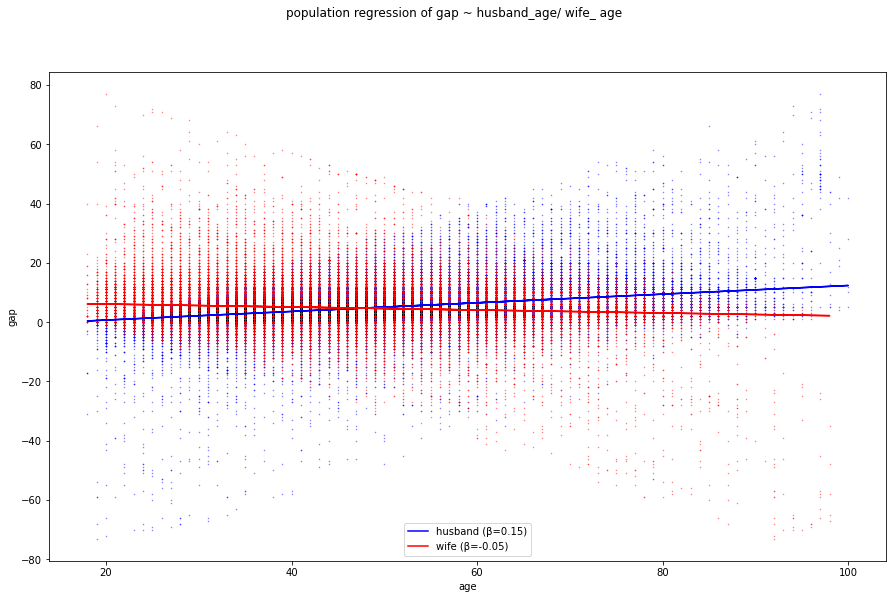

In [31]:
SCATTER_SAMPLE_SIZE = 120000

plt.figure(figsize=(15, 9))

lr = LinearRegression()
X = sdf.husband_age.values[:, np.newaxis]
# target data is array of shape (n,)
y = sdf.gap.values
lr.fit(X, y)
plt.plot(X, lr.predict(X), c='b', label='husband (β=%0.2f)' % lr.coef_)
rng = np.random.default_rng(seed=21)
Xs = rng.choice(X, SCATTER_SAMPLE_SIZE, replace=False)
rng = np.random.default_rng(seed=21)
ys = rng.choice(y, SCATTER_SAMPLE_SIZE, replace=False)
plt.scatter(Xs, ys, c='b', s=1, marker='.', alpha=0.5)


lr = LinearRegression()
X = sdf.wife_age.values[:, np.newaxis]
# target data is array of shape (n,)
y = sdf.gap.values
lr.fit(X, y)
plt.plot(X, lr.predict(X), c='r', label='wife (β=%0.2f)' % lr.coef_)
rng = np.random.default_rng(seed=21)
Xs = rng.choice(X, SCATTER_SAMPLE_SIZE, replace=False)
rng = np.random.default_rng(seed=21)
ys = rng.choice(y, SCATTER_SAMPLE_SIZE, replace=False)
plt.scatter(Xs, ys, c='r', s=1, marker='.', alpha=0.5)

plt.suptitle('population regression of gap ~ husband_age/ wife_ age')
plt.xlabel('age')
plt.ylabel('gap')
plt.legend()
plt.show()

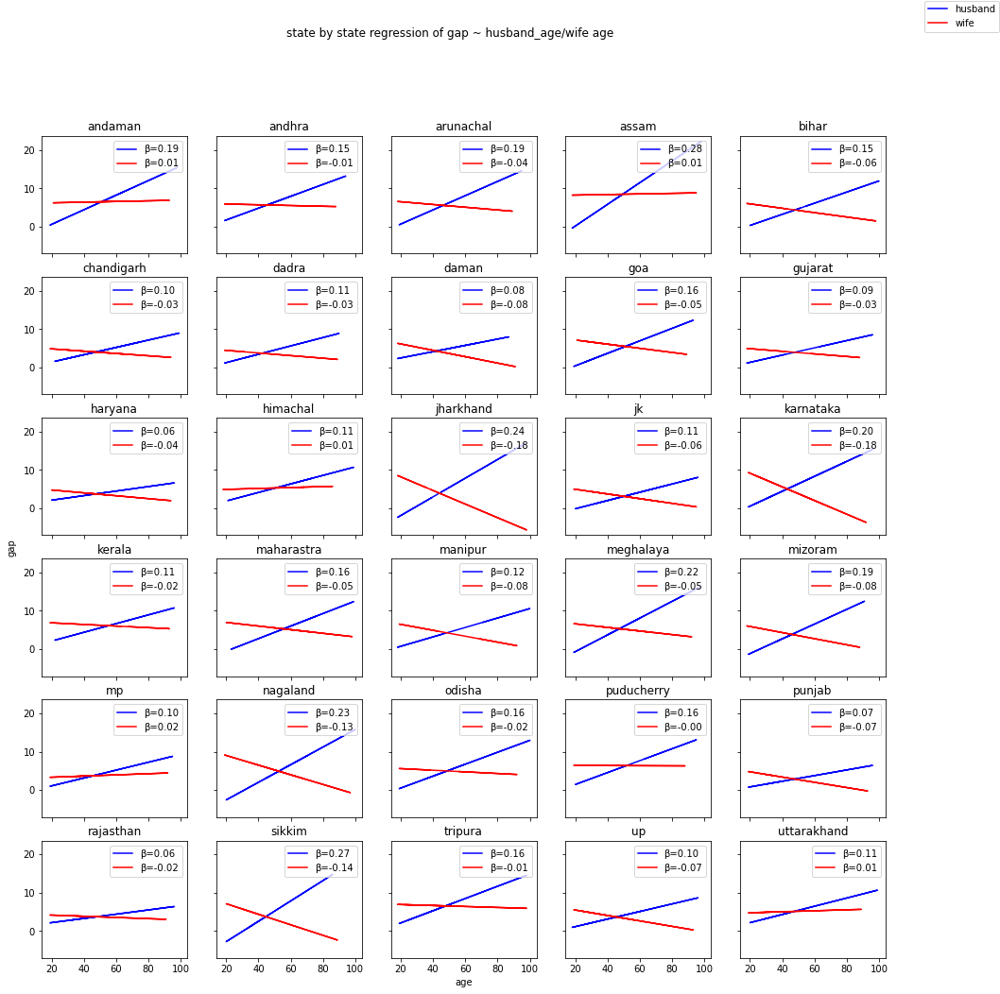

In [32]:
fig, axs = plt.subplots(6, 5, figsize=(16, 16), sharex=True, sharey=True)
fig.suptitle('state by state regression of gap ~ husband_age/wife age')
axs = axs.flatten()
for i, s in enumerate(sorted(sdf.state.unique())):
    #print(s)
    pdf = sdf[sdf.state == s]
    lr = LinearRegression()
    X = pdf.husband_age.values[:, np.newaxis]
    # target data is array of shape (n,)
    y = pdf.gap.values
    lr.fit(X, y)
    l1 = axs[i].plot(X, lr.predict(X), c='b', label='β=%0.2f' % lr.coef_)

    lr = LinearRegression()
    X = pdf.wife_age.values[:, np.newaxis]
    # target data is array of shape (n,)
    y = pdf.gap.values
    lr.fit(X, y)
    l2 = axs[i].plot(X, lr.predict(X), c='r', label='β=%0.2f' % lr.coef_)
    axs[i].set_title(s)
    axs[i].legend(loc='upper right')

# add a big axis, hide frame
fig.add_subplot(111, frameon=False)    
# Create the legend
fig.legend(labels=['husband', 'wife'],
           loc="upper right",
           borderaxespad=0.1,
           )
## hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.xlabel('age')
plt.ylabel('gap')
plt.show()

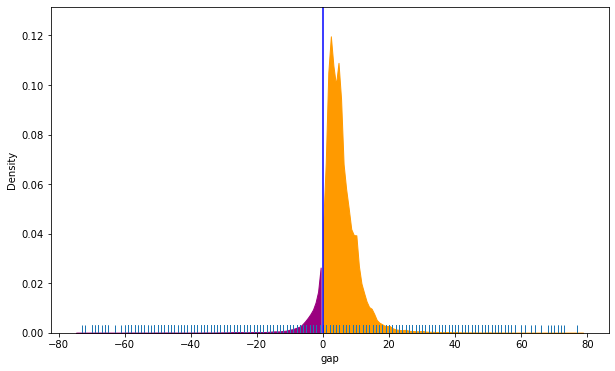

In [33]:
plt.figure(figsize=(10, 6))
ax = sns.kdeplot(data=sdf, x='gap', color='none')
kde_x, kde_y = ax.lines[0].get_data()

ax.fill_between(kde_x, kde_y, where=(kde_x <= 0), 
                interpolate=False, color='#9A007F')
ax.fill_between(kde_x, kde_y, where=(kde_x >= 0), 
                interpolate=False, color='#FF9A00')
sns.rugplot(data=sdf, x='gap')
# plotting the zero line
plt.axvline(x=0, color='#0000FF')
plt.show()

In [34]:
# % of couples that have gap > 0
len(sdf[sdf.gap > 0]) * 100 / len(sdf)

88.65083333333334

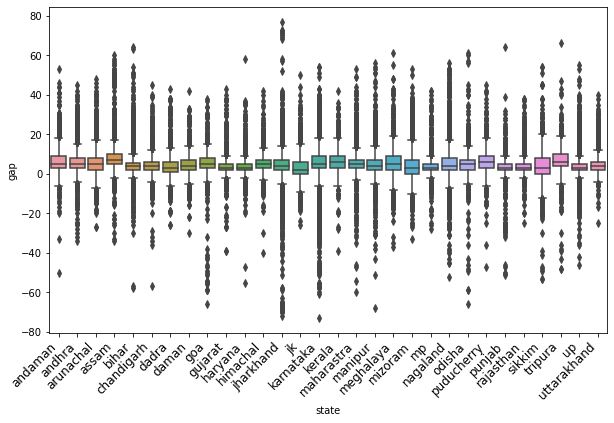

In [35]:
plt.figure(figsize=(10, 6))
ax = sns.boxplot(data=sdf, x='state', y='gap')
ax.set_xticklabels(
    ax.get_xticklabels(), 
    rotation=45, 
    horizontalalignment='right',
    fontsize='large'
)
plt.show()

In [36]:
sdf = sdf[(sdf.husband_age>30)&(sdf.husband_age<60)]

In [37]:
bdf = sdf.groupby(['state', 'husband_age']).agg({'gap': 'median'}).reset_index()
bdf

,state,husband_age,gap
0,andaman,31,2.0
1,andaman,32,2.0
2,andaman,33,3.0
3,andaman,34,4.0
4,andaman,35,4.0
...,...,...,...
865,uttarakhand,55,5.0
866,uttarakhand,56,5.0
867,uttarakhand,57,6.0
868,uttarakhand,58,5.0


In [38]:
import plotly.express as px
fig = px.line(bdf, x="husband_age", y="gap", color='state', line_group='state')
fig.show()

In [39]:
fig = px.scatter(sdf, x="husband_age", y="gap", color="state", marginal_y="box", trendline="lowess")
fig.show()